# Solving ODEs in `julia` with `DifferentialEquations.jl`

<img src = https://upload.wikimedia.org/wikipedia/commons/1/1f/Julia_Programming_Language_Logo.svg width = 200 align = "center" style = "padding:50px"> <img src = https://diffeq.sciml.ai/stable/assets/logo.png width = 200 align = "center" style = "padding:50px"> 

# Why use `DifferentialEquations.jl`?

- Fast
- Easy to use
- Lots of features!
- Has a python wrapper `diffeqpy`

# Ordinary Differential Equations

• Equaitons with the form:
$$
\frac{dx_i(t)}{dt} = f_i(\vec{x(t)}, \theta)
$$

• Simple ODEs easy to solve

## Example: Exponential growth
$$
\frac{dx(t)}{dt} = rx \qquad \longrightarrow \qquad x(t) = x(0)e^{rt}
$$


In [353]:
using Pkg
using Revise
Pkg.activate(".")

using DifferentialEquations, Plots
f(u,p,t) = 2*u
u0 = 1/2
tspan = (0.0,1.0)
prob = ODEProblem(f,u0,tspan)
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 27-element Vector{Float64}:
 0.0
 0.00944087511294902
 0.02663743413486857
 0.04721931537956772
 0.07246763821029875
 0.10127451422585745
 0.13372697067202527
 0.16910897063225103
 0.20710180048166432
 0.24718318569916004
 0.28898338454673006
 0.33212062670328574
 0.3762935431213862
 ⋮
 0.5126074554577175
 0.558721917613643
 0.6049649470461514
 0.6512511694075278
 0.6975153386474089
 0.7437088337562009
 0.7897962644010109
 0.835752822213198
 0.8815619981736796
 0.9272137682118287
 0.9727031009477026
 1.0
u: 27-element Vector{Float64}:
 0.5
 0.509530568871512
 0.5273597571038076
 0.5495208568539743
 0.5779823748356611
 0.6122600599890158
 0.653316723337469
 0.7012230604960634
 0.7565825887150959
 0.8197295508656902
 0.8912053457634159
 0.9715078527133763
 1.0612419845022005
 ⋮
 1.3938472512067768
 1.5285149677867047
 1.6766247810452248
 1.839244994587704
 2.0175491786072866
 2.212826122660205
 2.42648898019757

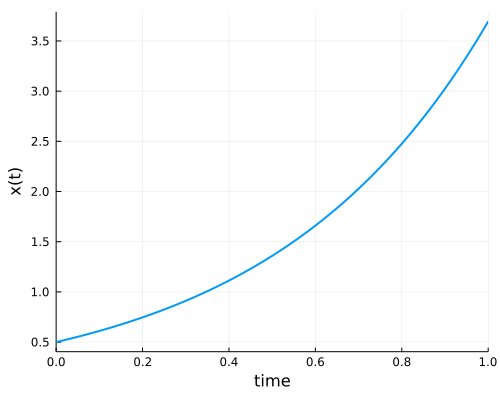

In [354]:
plot(sol, legend = false, xlab = "time", ylab = "x(t)", lw = 2, size = (500,400))

# Simple ODE system
## Generalised Lotka-Volterra

- Simple model of ecosystem dynamics 
- Need to use numerical simualtions to solve

$$
    \frac{dx_i}{dt} = x_i \left(r_i + \sum_{i \neq j}^N a_{ij} x_j \right)
$$

| Parameters |  |
| --- | --- |
| $x_i$  | Biomass of $i^\text{th}$ species | 
| $N$  | Number of Species | 
| $r_i$  | Growth rate of $i^\text{th}$ species | 
| $a_{ij}$  | Interaction between the $i^\text{th}$ and $j^\text{th}$ species | 

In [355]:
#load packages
using Pkg
Pkg.activate(".")

using DifferentialEquations
using Plots
using Random

In [356]:
#parameters
struct param
    N::Int
    r::Vector{Float64}
    a::Array{Float64,2}
end

#derivative function
function dx!(dx,x,p,t)
    for i = 1:p.N
        dx[i] = x[i] * p.r[i]
        for j = 1:p.N
            dx[i] += x[i] * x[j] * p.a[i,j]
        end
    end
end

dx! (generic function with 1 method)

In [357]:
Random.seed!(2)

#generate params
N = 10
r = rand(N)
a = -rand(N,N)
[a[i,i] = -2 for i = 1:N]
  
p = param(N,r,a)

#define ODE problem
tspan = (0.0,200.0)
x0 = rand(N) ./ 10
prob = ODEProblem(dx!,x0,tspan,p)
sol = solve(prob)

fieldnames(typeof(sol))

(:u, :u_analytic, :errors, :t, :k, :prob, :alg, :interp, :alg_choice, :dense, :tslocation, :destats, :retcode)

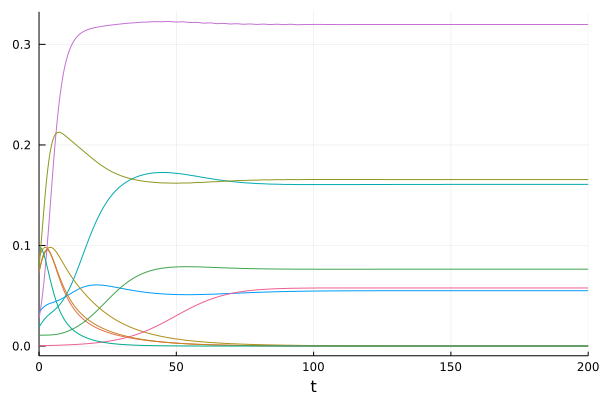

In [358]:
plot(sol, legend = false)

# Callbacks

- Ability to run code during simualtions
    - Numerically stable 
    - Efficent (dont have to restart the integrator)


## Callback structure

Callbacks are made up of two parts:
1. `condition(integrator)`: a function that detects when the callback should be used based on the state of the system
2. `affect!(integrator)`: a function that modifies the state of the system

## Example 1: Extinction Detection
Detect when species go extinct and reintroduce to the system

In [359]:
#get the smallest biomass
function condition(x,t,integrator)
  any(x .<= 0)
end

#add 1 to the smallest biomass
function affect!(integrator)
  integrator.u[findmin(integrator.u)[2]] = 0.5
end

affect! (generic function with 1 method)

In [363]:
Random.seed!(2)

#generate params
N = 10
r = rand(N)
a = -rand(N,N)
[a[i,i] = -2 for i = 1:N]
  
p = param(N,r,a)

#define ODE problem
tspan = (0.0,1000.0)
x0 = rand(N)

prob = ODEProblem(dx!,x0,tspan,p)
cb = DiscreteCallback(condition,affect!)
sol = @time solve(prob, callback = cb);

  0.001199 seconds (4.24 k allocations: 418.352 KiB)


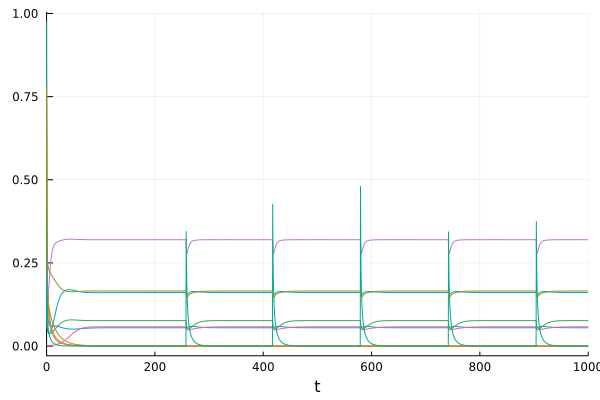

In [364]:
plot(sol, legend = false)

## Example 2: Altering parameters
Detect extinction and change parameters of extinct species

In [365]:
#get the smallest biomass
function condition(x,t,integrator)
  any(x .<= 0)
end

#add 1 to the smallest biomass and alter parameters
function affect!(integrator)
    #new biomass
    integrator.u[findmin(integrator.u)[2]] += 0.1
    
    #altered parameters
    integrator.p.r[findmin(integrator.u)[2]] = rand()
    integrator.p.a[findmin(integrator.u)[2],:] .= -rand(integrator.p.N) 
    integrator.p.a[findmin(integrator.u)[2],findmin(integrator.u)[2]] = -2.0
end

#save avg growthrate and interactions in the community
function save_func(x, t, integrator)
    return(sum(integrator.p.r)/ length(integrator.p.r),
          (sum(integrator.p.a)+ 2*integrator.p.N) / (length(integrator.p.a) - integrator.p.N) )
end

saved_values = SavedValues(Float64, Tuple{Float64,Float64})

SavedValues{tType=Float64, savevalType=Tuple{Float64, Float64}}
t:
Float64[]
saveval:
Tuple{Float64, Float64}[]

In [368]:
Random.seed!(2)

#generate params
N = 10
r = rand(N)
a = -rand(N,N)
[a[i,i] = -2 for i = 1:N]
  
p = param(N,r,a)

new_sp = DiscreteCallback(condition,affect!)
saving_cb = SavingCallback(save_func, saved_values)
cb = CallbackSet(new_sp, saving_cb)

tspan = (0.0,6e3)
x0 = rand(N)

prob = ODEProblem(dx!,x0,tspan,p)

sol = @time solve(prob, callback = cb);

  0.003688 seconds (15.22 k allocations: 1.633 MiB)


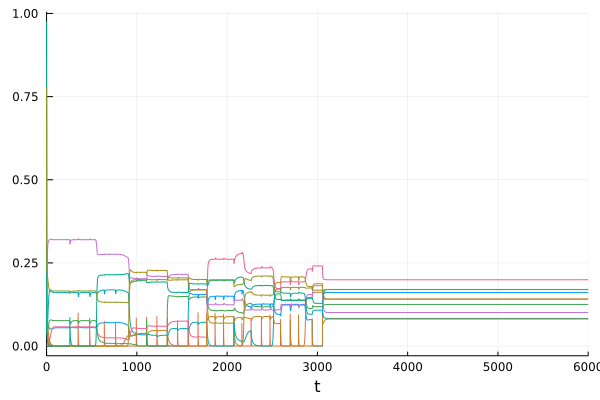

In [369]:
plot(sol, legend = false)

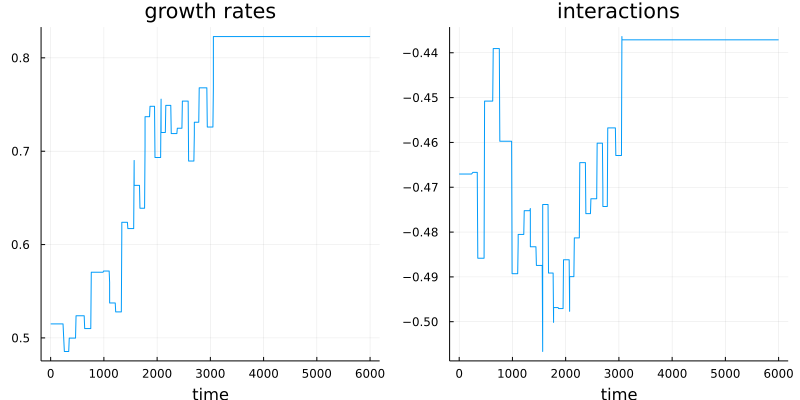

In [370]:
t = saved_values.t
r = map(x -> x[1], saved_values.saveval)
ā = map(x -> x[2], saved_values.saveval)

p1 = plot(t,r, title = "growth rates")
p2 = plot(t,ā, title = "interactions")
plot(p1,p2, size = (800, 400), legend = false, xlab = "time")

## Example 3: Changing integrator size

Adding new species by altering the size of the integrator on the go

In [371]:
#add 1 to the smallest biomass and alter parameters
function affect!(integrator)
    #get biomass array
    tmp = deepcopy(integrator.u)     
    #detect extant species
    ext = tmp .> eps()
    #get new system size
    integrator.p.N = (1 + sum(ext))
    #resize integrator
    resize!(integrator,integrator.p.N)

    #put in old biomass
    integrator.u[1:(integrator.p.N-1)] .= tmp[ext]
    #put in new biomass
    integrator.u[end] = 0.01
    
    #update params
    #growth rate
    deleteat!(integrator.p.r, .!ext)
    push!(integrator.p.r, rand())
    
    #interactions
    new_a = -rand(integrator.p.N, integrator.p.N) 
    new_a[integrator.p.N, integrator.p.N] = -2.0
    #add old data  
    new_a[1:(integrator.p.N-1) , 1:(integrator.p.N-1) ] .= integrator.p.a[ext, ext]

    integrator.p.a = new_a
end

function save_func(x, t, integrator)
    return(sum(integrator.p.r)/ length(integrator.p.r),
          (sum(integrator.p.a)+ 2*integrator.p.N) / (length(integrator.p.a) - integrator.p.N) )
end

saved_values = SavedValues(Float64, Tuple{Float64,Float64})

SavedValues{tType=Float64, savevalType=Tuple{Float64, Float64}}
t:
Float64[]
saveval:
Tuple{Float64, Float64}[]

In [374]:
Random.seed!(2)

#redefine parameters structure to be changeable
mutable struct param_mutable
    N::Int
    r::Vector{Float64}
    a::Array{Float64,2}
end

#generate params
N = 1
r = rand(N)
a = -rand(N,N)
[a[i,i] = -2 for i = 1:N]
  
p = param_mutable(N,r,a)

new_sp = PeriodicCallback(affect!, 100)
saving_cb = SavingCallback(save_func, saved_values)

cb = CallbackSet(new_sp, saving_cb)

tspan = (0.0,2e5)
x0 = rand(N)
prob = ODEProblem(dx!,x0,tspan,p)

sol = @time solve(prob, callback = cb);

  1.593246 seconds (1.16 M allocations: 227.388 MiB)


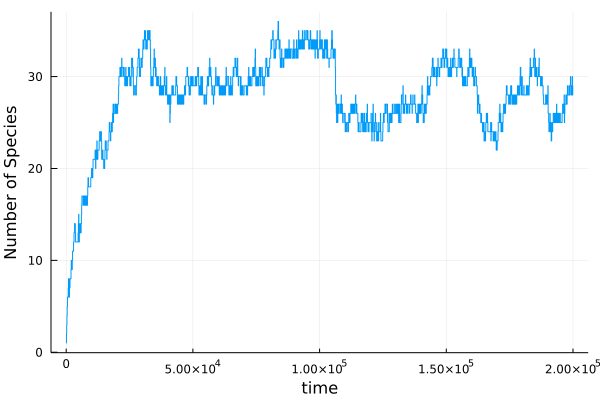

In [375]:
plot(sol.t, length.(sol.u), xlab = "time", ylab = "Number of Species", legend = false)

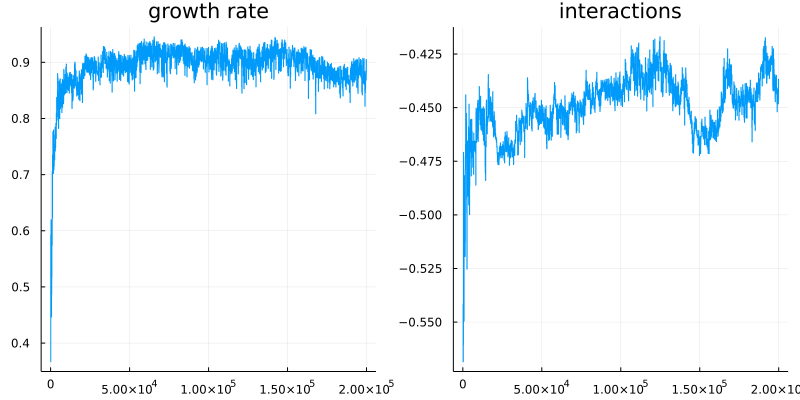

In [376]:
t = saved_values.t
r = map(x -> x[1], saved_values.saveval)
a = map(x -> x[2], saved_values.saveval)

p1 = plot(t,r, title = "growth rate")
p2 = plot(t,a, title = "interactions")

plot(p1,p2, legend = false, size = (800,400))

In [397]:
function simulate_with_extinctions(p)
    new_sp = PeriodicCallback(affect!, 100)
    saving_cb = SavingCallback(save_func, saved_values)

    cb = CallbackSet(new_sp, saving_cb)

    tspan = (0.0,6e3)
    x0 = rand(N)
    prob = ODEProblem(dx!,x0,tspan,deepcopy(p))

    solve(prob, callback = cb);
end

function affect_noext!(integrator)
    #get new system size
    integrator.p.N += 1 
    #resize integrator
    resize!(integrator,integrator.p.N)

    #put in new biomass
    integrator.u[end] = 0.01
    
    #update params
    #growth rate
    push!(integrator.p.r, rand())
    
    #interactions
    new_a = -rand(integrator.p.N, integrator.p.N) 
    new_a[integrator.p.N, integrator.p.N] = -2.0
    #add old data  
    new_a[1:(integrator.p.N-1) , 1:(integrator.p.N-1) ] .= integrator.p.a

    integrator.p.a = new_a
end

function simulate_no_extinctions(p)
    new_sp = PeriodicCallback(affect_noext!, 100)
    saving_cb = SavingCallback(save_func, saved_values)

    cb = CallbackSet(new_sp, saving_cb)

    tspan = (0.0,6e3)
    x0 = rand(N)
    prob = ODEProblem(dx!,x0,tspan,deepcopy(p))

    solve(prob, callback = cb);
end


simulate_no_extinctions (generic function with 1 method)

### Expanding System Comparison

In [401]:
#generate params
N = 1
r = rand(N)
a = -rand(N,N)
[a[i,i] = -2 for i = 1:N]
  
p = param_mutable(N,r,a)

println("with extinctions:")
@time simulate_with_extinctions(p);
println("without extinctions:")
@time simulate_no_extinctions(p);

with extinctions:
  0.011131 seconds (32.65 k allocations: 3.788 MiB)
without extinctions:
  0.807227 seconds (39.37 k allocations: 6.585 MiB)
